# Table of Contents:
1. [Library Imports](#library-imports)
2. [Data](#data)
3. [Data Transformations](#data-transformations)
4. [Data Visualization](#dataviz)
5. [Data Corrections](#data-corrections)
6. [After Treatment Data Visualization](#at-dataviz)
7. [Imputation](#imputation)
8. [Outliers](#outliers)
9. [Feature Engineering](#feature-engineering)
10. [Descobertas](#descobertas)
11. [Duvidas](#duvidas)
12. [Extras](#extras)
13. [IDs](#ids)


# Library Imports
<a id='library-imports'></a>

In [51]:
### BASIC LIBRARIES
# from datetime import datetime
# !pip install numpy
import numpy as np
# !pip install pandas
import pandas as pd

### VISUALIZATION
# !pip install matplotlib
import matplotlib.pyplot as plt
# !pip install seaborn
import seaborn as sns
# !pip install plotly
# import plotly.express as px
# !pip install squarify
# import squarify
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10
# !pip install nbformat>=4.2.0

### SKLEARN
# !pip install scikit-learn
# from sklearn.preprocessing import StandardScaler
# from sklearn.impute import KNNImputer
# from sklearn.model_selection import train_test_split
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score

### WARNINGS
import warnings
warnings.filterwarnings('ignore')

### FUNCTIONS
from utils1 import *

### AUTORELOAD
%load_ext autoreload
%autoreload 2


# Set the path to the data files
# path = "C:\\Users\\ritaf\\Documentos\\Estudos\\NovaIMS\\Mestrado_GIBI\\DM_I\\DM_Project\\"


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Open Data
<a id='data'></a>

In [52]:
data = pd.read_csv('Data\project_data.csv')

In [53]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123683 entries, 0 to 123682
Data columns (total 31 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   ID_Client               123354 non-null  object 
 1   Frequency_items         123683 non-null  int64  
 2   Potencial_Score         123683 non-null  float64
 3   ZIP_Code                123089 non-null  object 
 4   Longevity_months        123683 non-null  int64  
 5   Latitude                123683 non-null  float64
 6   Longitude               123683 non-null  float64
 7   Credit_factor           123683 non-null  float64
 8   Relevance_criteria      123683 non-null  object 
 9   Store_state             123683 non-null  object 
 10  Recency_in_weeks        123683 non-null  int64  
 11  Returns                 123683 non-null  int64  
 12  ID_Store_last           123683 non-null  int64  
 13  Gender                  42566 non-null   object 
 14  Flaged              

In [54]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Frequency_items,123683.0,38.261224,13.594001,1.0,29.000000,37.00000,47.000000,131.000000
Potencial_Score,123683.0,30.392316,99.673585,-1.0,0.800000,24.05884,39.701604,11481.040829
Longevity_months,123683.0,13.665354,9.881178,-12.0,6.000000,13.00000,21.000000,45.000000
Latitude,123683.0,25.249363,29.997630,-5.0,-0.166667,1.00000,60.126211,72.170287
Longitude,123683.0,6.158188,7.697199,-5.0,-0.166667,1.00000,13.971501,30.973885
Credit_factor,123683.0,0.899913,0.799920,0.0,0.700000,0.70000,1.000000,28.400000
Recency_in_weeks,123683.0,11.244706,3.799946,-4.0,9.000000,11.00000,14.000000,18.000000
Returns,123683.0,4.310972,27.629597,-87.0,0.000000,0.00000,0.000000,591.000000
ID_Store_last,123683.0,1.000000,0.000000,1.0,1.000000,1.00000,1.000000,1.000000
Flaged,123683.0,0.010373,0.101639,0.0,0.000000,0.00000,0.000000,2.000000


# Data Transformations
<a id='data-transformations'></a>

| Column | NaN | Ws/Unkwn | Outliers | Negs | Ambiguous | Dups | Wrong Type | Notes |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| ID_Client | x | x |  |  |  | x |  |  |
| Frequency_items |  |  |  |  |  |  |  |  |
| Potencial_Score |  |  | x | x |  |  |  | Round |
| ZIP_Code | x | x |  |  |  |  | x | Obj -> int |
| Longevity_months |  |  |  | x |  |  |  | Calculated 31/12/2023 |
| Latitude & Longitude |  |  |  |  |  |  |  | Block in Africa |
| Credit_factor |  |  | x |  |  |  |  | Different interpretation |
| Relevance_criteria |  | x |  |  |  |  |  | Might convert to boolean |
| Recency_in_weeks |  |  |  | x |  |  |  | Calculated 31/12/2023 |
| Returns |  |  | x | x | |  |  |  |
| Gender | x |  |  |  | x |  |  | Drop -> too many outliers |
| Flaged |  |  |  |  | x |  | x | Is a bool but has 2s |
| Promotional_percentage |  |  | x | x |  |  |  |  |
| Education | x | x |  |  | x |  |  | Drop -> too many outliers |
| Beer |  |  | x |  |  |  |  |  |
| Bottled_Water |  |  | x |  |  |  |  |  |
| Dairy |  |  | x |  |  |  | x | Obj -> int |
| Fresh_Foods |  |  | x | x |  |  |  |  |
| Frozen_Foods | x |  | x | x |  |  |  |  |
| Fruit_Beverages |  |  | x | x |  |  |  |  |
| Pastry |  |  | x |  |  |  |  |  |
| Sodas |  |  | x | x |  |  |  |  |
| Toiletries |  |  | x | x |  |  |  |  |
| Veggies |  |  | x | x |  |  |  |  |
| Wines |  |  | x | x |  |  |  |  |
| ID_Store_last |  |  |  |  |  |  |  | Constant |
| Checked_ok |  |  |  |  |  |  |  | Constant |
| Store_state |  |  |  |  |  |  |  | Constant |

In [55]:
# Droping constant columns
data.drop(columns=['ID_Store_last', 'Checked_ok', 'Store_state'], inplace=True)

# Setting up missing values as NaN
data['ID_Client'].replace(' ', np.nan, inplace=True)
data['ZIP_Code'].replace('  ', np.nan, inplace=True) # 1% of NaN
data['Relevance_criteria'].replace('Unknown', np.nan, inplace=True) # 1,7% of NaN
data['Gender'].replace({'    ': np.nan, 'm': np.nan, 'mm': np.nan, 'j': np.nan}, inplace=True) # 73% of NaN
data['Flaged'].replace(2, np.nan, inplace=True) # ~0% of NaN - VAI SER PRECISO CORRIGIR DATATYPES DEPOIS DE IMPUTAR (FICOU FLOAT POR CAUSSA DE NAN)
data['Education'].replace(' ', np.nan, inplace=True) # 42% of NaN -> possivel imputar com NumID!

# Correcting ambiguity
data['Gender'].replace({'Female': 'female'}, inplace=True) # 73% of NaN
data['Education'].replace({'High School ': 'High School', 'Bachelor Degree': 'BSc Degree'}, inplace=True) # 42% of NaN -> possivel imputar com NumID!

# Datatype correction
data['ZIP_Code'] = data['ZIP_Code'].astype(float)

dairy_values = data['Dairy'].str.split(',', expand=True)
dairy_values[1] = dairy_values[1].astype(float)
if (dairy_values[1] != 0).any():
    data['Dairy'] = data['Dairy'].str.replace(',', '.').astype(float)
else:
    data['Dairy'] = data['Dairy'].str.replace(',000', '').astype(int)

if ((data['Toiletries'].dropna() % 1 == 0).all()):
    data['Toiletries'] = data['Toiletries'].fillna(1000).astype(int)
    data['Toiletries'] = data['Toiletries'].replace(1000, np.nan) # no missing values

# Categorical value conversion
data['Relevance_criteria'] = data['Relevance_criteria'].replace({'Priority': 1, 'Caution': 0})
data['Gender'] = data['Gender'].replace({'male': 1, 'female': 0})
data['Education'] = data['Education'].replace({'High School': 1, 'Degree': 2, 'BSc Degree': 3, 'MSc Degree': 4})


# Other transformations
data['Potencial_Score'] = data['Potencial_Score'].round(2)


# Correcting Data Types - VAI SER PRECISO CORRIGIR DATATYPES DEPOIS DE IMPUTAR (FICOU FLOAT POR CAUSSA DE NAN)
# if ((data['Frozen_Foods'].dropna() % 1 == 0).all()):
#     data['Frozen_Foods'] = data['Frozen_Foods'].fillna(1000).astype(int)
#     data['Frozen_Foods'] = data['Frozen_Foods'].replace(1000, np.nan) # 0,5% of NaN



# Data Visualization
<a id='dataviz'></a>

In [56]:
data.columns

Index(['ID_Client', 'Frequency_items', 'Potencial_Score', 'ZIP_Code',
       'Longevity_months', 'Latitude', 'Longitude', 'Credit_factor',
       'Relevance_criteria', 'Recency_in_weeks', 'Returns', 'Gender', 'Flaged',
       'Promotional_percentage', 'Education', 'Beer', 'Bottled_Water', 'Bread',
       'Meat', 'Dairy', 'Fresh_Foods', 'Frozen_Foods', 'Fruit_Beverages',
       'Pastry', 'Sodas', 'Toiletries', 'Veggies', 'Wines'],
      dtype='object')

### Ranges

In [57]:
numeric_columns = ['Potencial_Score', 'Credit_factor', 'Returns', 'Promotional_percentage', 'Beer', 'Bottled_Water', 
                   'Bread', 'Meat', 'Dairy', 'Fresh_Foods', 'Frozen_Foods', 'Fruit_Beverages', 'Pastry', 'Sodas', 
                   'Toiletries', 'Veggies', 'Wines']
categorical_columns = ['Frequency_items', 'ZIP_Code', 'Longevity_months', 'Relevance_criteria', 'Recency_in_weeks',
                       'Gender', 'Education', 'Flaged']

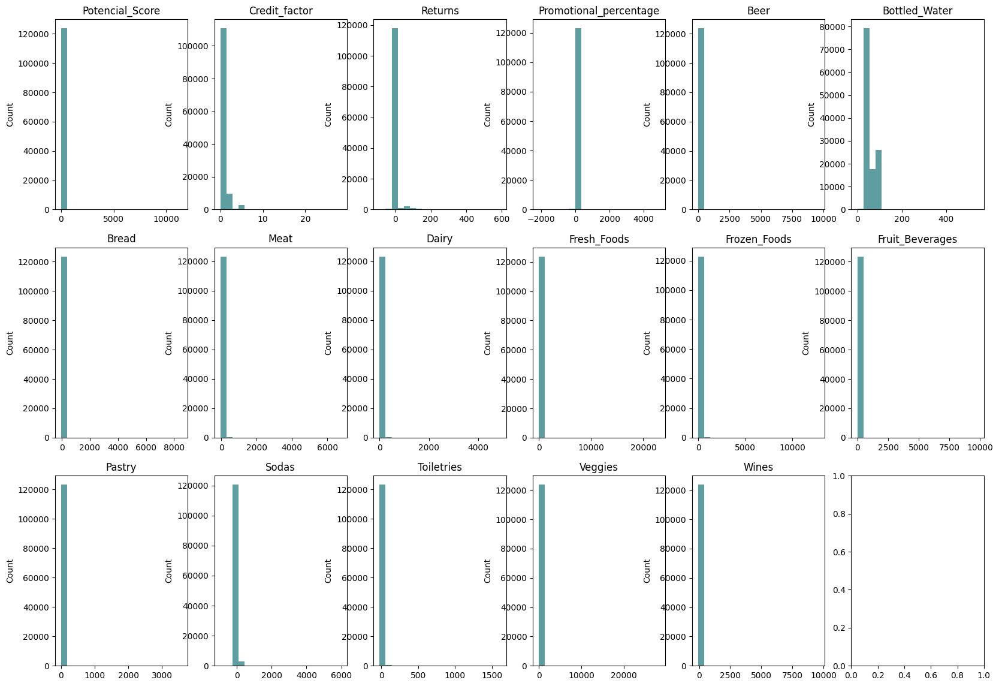

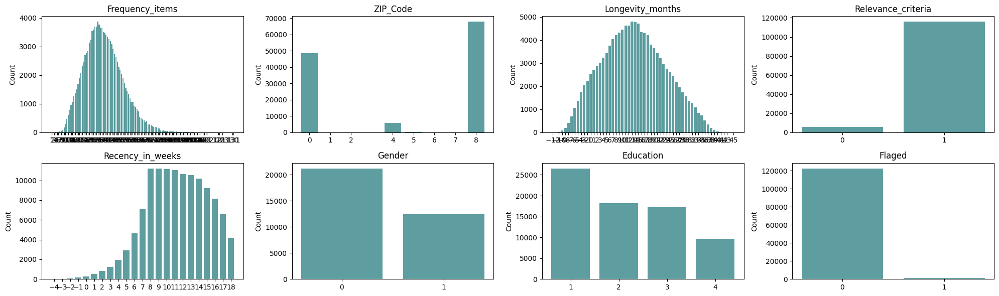

In [58]:
fig_hist, axs_hist = plt.subplots(nrows=3, ncols=6, figsize=(20, 14))
axs_hist = axs_hist.flatten()

fig_bar, axs_bar = plt.subplots(nrows=2, ncols=4, figsize=(20, 6))
axs_bar = axs_bar.flatten()

for i, col in enumerate(numeric_columns):
    plot_histogram(axs_hist[i], data, col, '')
    axs_hist[i].set_title(col)

for i, col in enumerate(categorical_columns):
    plot_bar_chart(axs_bar[i], data, col, '')
    axs_bar[i].set_title(col)

plt.tight_layout()
plt.show()


### Maps

In [22]:
# Sort the DataFrame by the frequency of ZIP_Code
data['ZIP_Code'] = pd.Categorical(data['ZIP_Code'], categories=data['ZIP_Code'].value_counts().index, ordered=True)
data_sorted = data.sort_values('ZIP_Code')

print('Normal Coordinates')
plot_map(data_sorted, 'ZIP_Code', 'ID_Client', 1.2)
print('Inverted Coordinates')
plot_map(data_sorted, 'ZIP_Code', 'ID_Client', 1.6, invert=True)

Normal Coordinates


Inverted Coordinates


# Data Corrections
<a id='data-corrections'></a>

### Multi-Variable Inconsistencies

Check for inconsistencies in returns

In [23]:
# SET INCONSISTENT VALUES OF RETURNS AS NaN
spent_amounts = ['Beer', 'Bottled_Water', 'Bread', 'Meat', 'Dairy', 'Fresh_Foods', 'Frozen_Foods', 'Fruit_Beverages', 'Pastry', 'Sodas', 'Toiletries', 'Veggies', 'Wines']

# Identify rows where Returns are 0 and there are negative values in any of the spent_amounts_to_check_neg
rows_with_neg_values = data[(data['Returns'] == 0) & (data[spent_amounts] < 0).any(axis=1)]

# Iterate over these rows and update the Returns column and negative values
for index, row in rows_with_neg_values.iterrows():
    data.at[index, 'Returns'] = np.nan

# Check percentage of Returns Missing Values
print(f'Number of inconsistencies: {rows_with_neg_values.shape[0]}')
print(f"Current percentage Returns' null values: {round(data[data['Returns'].isnull()].shape[0] / 123683 * 100, 2)}%")

Number of inconsistencies: 44090
Current percentage Returns' null values: 35.65%


### Negative Values Inconsistencies

Negative Spent Amounts and Promotional Percentage

In [24]:
# Percentage of negative values in each spent amounts column
spent_amounts.append('Promotional_percentage')

# Create a DataFrame to store the results
negative_percentage_df = pd.DataFrame()

# Add the negative percentage data for each dataset
negative_percentage_df['%Neg Values'] = round((((data[spent_amounts] < 0).sum()) / data.shape[0]) * 100, 2)
spent_amounts.remove('Promotional_percentage')

# Transpose the DataFrame for better readability
# negative_percentage_df = negative_percentage_df.T

# Filter out columns with zero percentage
# negative_percentage_df = negative_percentage_df.loc[:, (negative_percentage_df != 0).any(axis=0)] # for transposed DataFrame
negative_percentage_df = negative_percentage_df.loc[(negative_percentage_df != 0).any(axis=1), :]

# Sort values
negative_percentage_df = negative_percentage_df.sort_values(by='%Neg Values', ascending=False)

# Display the DataFrame
negative_percentage_df

,%Neg Values
Wines,13.64
Veggies,12.60
Sodas,11.70
Toiletries,3.85
Promotional_percentage,1.17
Fruit_Beverages,1.04
Fresh_Foods,0.95
Frozen_Foods,0.89
Meat,0.06


In [25]:
# Set negative spent amounts and promotional percentage to 0
data[spent_amounts] = data[spent_amounts].applymap(lambda x: max(x, 0))
data['Promotional_percentage'] = data['Promotional_percentage'].apply(lambda x: max(x, 0))

Negative Returns, Recency & Longevity

In [26]:
# Change the recency baseline date to 4 weeks later
data['Recency_in_weeks'] = data['Recency_in_weeks'] + 4 

In [27]:
# SET NEGATIVE VALUES IN RETURNS, RECENCY AND LONGEVITY AS NaN TO BE IMPUTED LATER
# inconsistent_neg_cols = ['Returns', 'Recency_in_weeks', 'Longevity_months']
inconsistent_neg_cols = ['Returns', 'Longevity_months']
for col in inconsistent_neg_cols:
    data[col] = data[col].apply(lambda x: np.nan if x < 0 else x)

print(f'Returns missing values: {round(data["Returns"].isna().sum() / 123683 * 100, 2)}%')
print(f'Longevity missing values: {round(data["Longevity_months"].isna().sum() / 123683 * 100,2)}%')

Returns missing values: 37.32%
Longevity missing values: 7.95%


### Missing Values & Messed Up Data

Create a copy of the data

In [28]:
data_copy = data.copy()

Drop columns with high percentages of missing values

In [29]:
# Calculate the threshold for 35% NaNs
threshold = len(data) * 0.35

# Identify columns to drop
columns_to_drop = data.columns[data.isna().sum() > threshold]

# Create a copy of the data
# Drop the columns
data.drop(columns=columns_to_drop, inplace=True)

# Print the names of the dropped columns
print("Dropped columns:", columns_to_drop.tolist())

Dropped columns: ['Returns', 'Gender', 'Education']


Drop irrelevant columns (geographical) and the id

In [30]:
# Dropping georaphical irrelevant columns
data.drop(columns=['Latitude', 'Longitude', 'ZIP_Code'], inplace=True)

data.drop(columns=['ID_Client'], inplace=True) # Comment to run the ID Section of this Notebook

# After Treatment Data Visualization
<a id='at-dataviz'></a>

### Ranges

In [31]:
numeric_columns_after = ['Frequency_items', 'Credit_factor',
       'Promotional_percentage', 'Beer', 'Bottled_Water', 'Bread', 'Meat', 'Dairy', 'Fresh_Foods', 'Frozen_Foods', 'Fruit_Beverages', 'Pastry',
       'Sodas', 'Toiletries', 'Veggies', 'Wines']
categorical_columns_after = ['Longevity_months', 'Relevance_criteria', 'Recency_in_weeks', 'Flaged']

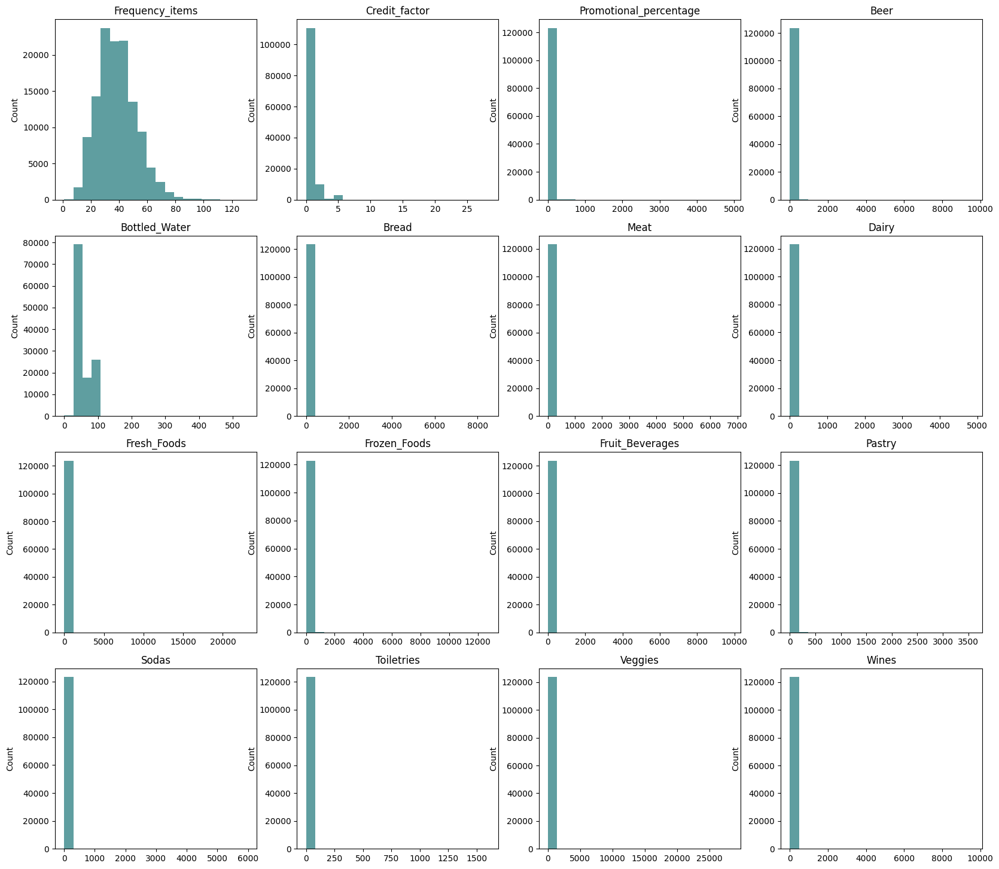

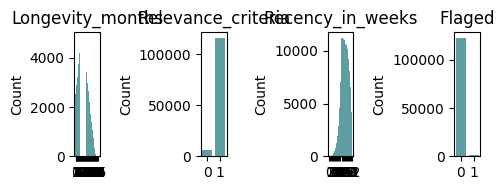

In [35]:
fig_hist, axs_hist = plt.subplots(nrows=4, ncols=4, figsize=(20, 18))
axs_hist = axs_hist.flatten()

fig_bar, axs_bar = plt.subplots(nrows=1, ncols=4, figsize=(5, 2))
axs_bar = axs_bar.flatten()

for i, col in enumerate(numeric_columns_after):
    plot_histogram(axs_hist[i], data, col, '')
    axs_hist[i].set_title(col)

for i, col in enumerate(categorical_columns_after):
    plot_bar_chart(axs_bar[i], data, col, '')
    axs_bar[i].set_title(col)

plt.tight_layout()
plt.show()


### Correlation

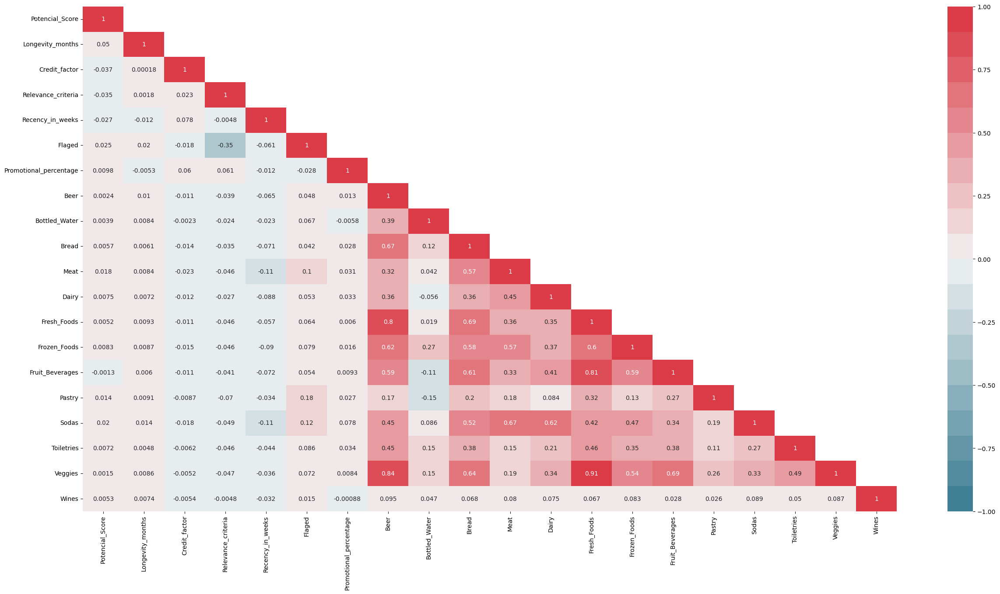

In [36]:
plot_correlation_matrix(data.iloc[:, 1:], 'pearson')

# Imputation
<a id='imputation'></a>

# Outliers
<a id='outliers'></a>

In [ ]:
def detect_outliers_iqr_with_stats(df):
    stats = {}
    
    for col in df.select_dtypes(include='number').columns:
        Q1 = df[col].quantile(0.25)  # First quartile (25%)
        Q3 = df[col].quantile(0.75)  # Third quartile (75%)
        IQR = Q3 - Q1  # Interquartile range
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Calculate outliers
        outliers = ((df[col] < lower_bound) | (df[col] > upper_bound))
        percentage_outliers = 100 * outliers.sum() / len(df)
        
        # Store results
        stats[col] = {
            'Lower Bound': lower_bound,
            'Upper Bound': upper_bound,
            'Percentage Outliers': percentage_outliers
        }
    
    return pd.DataFrame(stats).T

outlier_stats = detect_outliers_iqr_with_stats(data)
outlier_stats


,Lower Bound,Upper Bound,Percentage Outliers
Frequency_items,2.000000,74.000000,1.067244
Potencial_Score,-57.550000,98.050000,0.680773
ZIP_Code,-12.000000,20.000000,0.000000
Longevity_months,-16.500000,43.500000,0.000809
Latitude,-90.605983,150.565527,0.000000
Longitude,-21.373918,35.178753,0.000000
Credit_factor,0.250000,1.450000,20.802374
Relevance_criteria,1.000000,1.000000,4.656258
Recency_in_weeks,1.500000,21.500000,0.858647
Returns,0.000000,0.000000,6.126954


In [ ]:
def remove_outliers_iqr(df):
    # Create a mask for rows without outliers
    no_outliers_mask = pd.Series(True, index=df.index)
    
    for col in df.select_dtypes(include='number').columns:
        Q1 = df[col].quantile(0.25)  # First quartile (25%)
        Q3 = df[col].quantile(0.75)  # Third quartile (75%)
        IQR = Q3 - Q1  # Interquartile range
        
        # Define bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Update the mask
        no_outliers_mask &= (df[col] >= lower_bound) & (df[col] <= upper_bound)
    
    # Filter the DataFrame
    df_no_outliers = df[no_outliers_mask]
    
    return df_no_outliers

data_no_outliers_iqr = remove_outliers_iqr(data)
print("DataFrame without IQR outliers:")
data_no_outliers_iqr


DataFrame without IQR outliers:


,ID_Client,Frequency_items,Potencial_Score,ZIP_Code,Longevity_months,Latitude,Longitude,Credit_factor,Relevance_criteria,Recency_in_weeks,...,Meat,Dairy,Fresh_Foods,Frozen_Foods,Fruit_Beverages,Pastry,Sodas,Toiletries,Veggies,Wines
2,9253304IST6NKID248,48,1.60,0.0,32,0.428571,1.000000,0.7,1.0,16,...,0,89,39,-6.0,25,32,17,33,26,-13
33,10354544EVA9NKID493,31,35.25,8.0,26,0.800000,0.500000,1.0,1.0,15,...,0,89,52,20.0,20,23,21,32,23,28
38,9251530VAR9NKID337,54,24.69,8.0,22,-0.600000,-2.000000,1.0,1.0,11,...,0,91,6,43.0,16,31,32,30,-1,-2
48,9564163AGE7NKID531,67,0.40,0.0,12,0.000000,-1.666667,0.7,1.0,15,...,0,94,18,30.0,-1,29,22,21,20,21
70,10351488GAL10NKID639,21,40.28,8.0,27,63.223964,17.205688,1.0,1.0,15,...,0,89,14,38.0,3,27,60,19,28,45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122721,11539036féG13NKID321,17,33.38,8.0,27,63.444251,18.199122,1.0,1.0,6,...,0,17,137,101.0,88,44,27,15,33,2
122724,11539036féG13NKID507,17,34.88,8.0,27,65.027584,19.199122,1.0,1.0,12,...,0,17,62,102.0,11,44,28,23,28,16
122726,9264382RTI16NKID620,37,-0.30,0.0,2,0.333333,0.166667,1.0,1.0,13,...,0,17,112,94.0,99,34,-4,18,21,1
122878,10254861ENT7NKID653,28,80.70,8.0,7,62.552853,12.431741,0.7,1.0,8,...,0,142,88,24.0,32,32,16,22,16,47


In [69]:
7672/123683*100

6.202954326787028

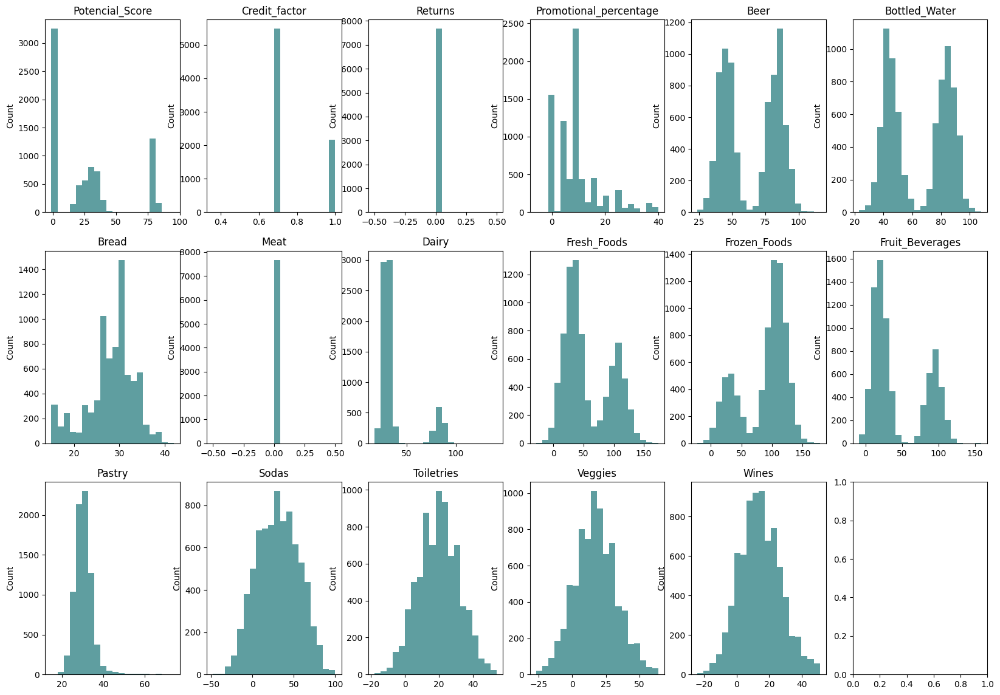

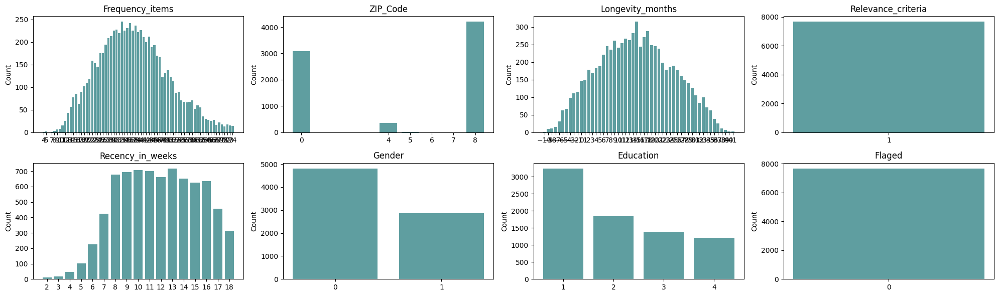

In [ ]:
fig_hist, axs_hist = plt.subplots(nrows=3, ncols=6, figsize=(20, 14))
axs_hist = axs_hist.flatten()

fig_bar, axs_bar = plt.subplots(nrows=2, ncols=4, figsize=(20, 6))
axs_bar = axs_bar.flatten()

for i, col in enumerate(numeric_columns):
    plot_histogram(axs_hist[i], data_no_outliers_iqr, col, '')
    axs_hist[i].set_title(col)

for i, col in enumerate(categorical_columns):
    plot_bar_chart(axs_bar[i], data_no_outliers_iqr, col, '')
    axs_bar[i].set_title(col)

plt.tight_layout()
plt.show()


# Feature Engineering
<a id='feature-engineering'></a>

Create a Total amount spent

Create the percentages of total amount spent per category

# Mais descobertas ainda não discutidas
<a id='descobertas'></a>

As nossas ultimas 297 linhas (sem contar com a ultima, for some reason) tem todas as spent amounts a 0

In [ ]:
# Calculate the sum of the spent amount columns for each row
data['Spent_Sum'] = data[spent_amounts].sum(axis=1)

# Filter the rows where the sum is 0
rows_with_zero_spent = data[data['Spent_Sum'] == 0]

# Display the filtered rows
rows_with_zero_spent

,Frequency_items,Potencial_Score,Longevity_months,Credit_factor,Relevance_criteria,Recency_in_weeks,Flaged,Promotional_percentage,Beer,Bottled_Water,...,Dairy,Fresh_Foods,Frozen_Foods,Fruit_Beverages,Pastry,Sodas,Toiletries,Veggies,Wines,Spent_Sum
123386,55,18.53,NaN,0.7,1.0,17,0.0,10.0,0,0,...,0,0,0.0,0,0,0,0,0,0,0.0
123387,36,37.00,28.0,0.7,1.0,13,0.0,6.0,0,0,...,0,0,0.0,0,0,0,0,0,0,0.0
123388,50,-0.20,22.0,0.7,1.0,17,0.0,8.0,0,0,...,0,0,0.0,0,0,0,0,0,0,0.0
123389,6,79.67,24.0,0.7,1.0,13,0.0,0.0,0,0,...,0,0,0.0,0,0,0,0,0,0,0.0
123390,33,21.83,22.0,0.7,1.0,17,0.0,24.0,0,0,...,0,0,0.0,0,0,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123678,33,79.60,21.0,0.7,1.0,19,0.0,0.0,0,0,...,0,0,0.0,0,0,0,0,0,0,0.0
123679,37,0.30,NaN,0.7,1.0,13,0.0,16.0,0,0,...,0,0,0.0,0,0,0,0,0,0,0.0
123680,43,79.17,11.0,0.7,1.0,14,0.0,30.0,0,0,...,0,0,0.0,0,0,0,0,0,0,0.0
123681,75,33.31,31.0,0.7,1.0,21,0.0,0.0,0,0,...,0,0,0.0,0,0,0,0,0,0,0.0


In [ ]:
# Drop the rows where the sum is 0
data = data[data['Spent_Sum'] != 0]

# Duvidas
<a id='duvidas'></a>

1. Podemos assumir que quem tem null na educação é porque não tem educação?
    - ou podemos imputa-la com base nos IDs?

2. As nossas ultimas rows (297) têm o valor de todas as spent amounts a 0. Podemos apagalas?

3. Colunas de percentagem (Potencial Score e Credit Factor): Os valores vão mesmo de -100 a 100 (para potencial score) e 0 a 100 (para credit factor) ou é suposto terem sido convertidos para valores de -1 a 1 e 0 a 1, respetivamente?

4. Valores irreais em variaveis calculadas por outros modelos podem ser convertidos para o valor aceitável mais proximo? Por exemplo, para o Potencial Score, podemos assumir que o modelo foi incorretamente feito com uma regressão linear que permite valores acima de 100 e que portanto o valor deveria ser convertido para 100?

5. Os valores da coluna Flagged que são 2, é para por NaN, certo? Não faz sentido converter para 1, ou faz?

6. Valores negativos em categorias de produtos são returns. Ou seja, são valores de compras de 2022 que foram devolvidas em 2023, certo? Ou seja, se eu comprei 20 euros em vinho em 2022 e os devolvi em 2023, considerando que não comprei mais vinho em 2023, o valor dessa categoria fica a -20, certo?

7. Valores negativos da coluna returns são considerados erros, ou têm alguma interpretação?

8. Se tivermos rows com valores negativos em algumas categorias de produtos e 0 na coluna das returns, é uma inconsistência, certo? 

# Extras
<a id='extras'></a>

In [ ]:
# SOMAR OS VALORES NEGATIVOS DOS SPENT AMOUNTS E COLOCAR EM MODULO NA COLUNA RETURNS
# Identify rows where Returns are 0 and there are negative values in any of the columns_to_check_neg
rows_with_neg_values = data[(data['Returns'] == 0) & (data[columns_to_check_neg] < 0).any(axis=1)]

# Iterate over these rows and update the Returns column
for index, row in rows_with_neg_values.iterrows():
    # Sum the negative values, turn it into a positive value
    negative_sum = row[columns_to_check_neg][row[columns_to_check_neg] < 0].sum() * -1
    # Update the Returns column
    data.at[index, 'Returns'] = negative_sum

# Display the updated rows to verify
data.loc[rows_with_neg_values.index, ['Returns'] + columns_to_check_neg]

,Returns,Beer,Bottled_Water,Bread,Meat,Dairy,Fresh_Foods,Frozen_Foods,Fruit_Beverages,Pastry,Sodas,Toiletries,Veggies,Wines
1,12,46,58,14,7,90,134,26.0,20,31,-12,2,18,2
2,19,39,57,17,0,89,39,-6.0,25,32,17,33,26,-13
3,2,50,41,17,0,89,26,66.0,16,29,31,28,-2,8
4,2,43,46,13,0,90,-2,57.0,27,45,46,19,23,9
12,7,51,49,25,0,89,11,38.0,22,33,-7,20,105,68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123370,7,51,48,29,1,100,88,151.0,117,109,124,7,-7,11
123373,6,51,48,29,1,100,88,234.0,109,26,94,20,-6,6
123379,2,39,37,12,6,100,42,50.0,33,25,70,22,-2,31
123383,11,61,48,13,9,100,61,41.0,26,25,27,23,11,-11


In [ ]:
# # Select the columns you want to include in the scatter plots
# columns_to_plot = numeric_columns + categorical_columns

# # Create a pairplot
# sns.pairplot(data[columns_to_plot])
# plt.show()

# IDs
<a id='ids'></a>

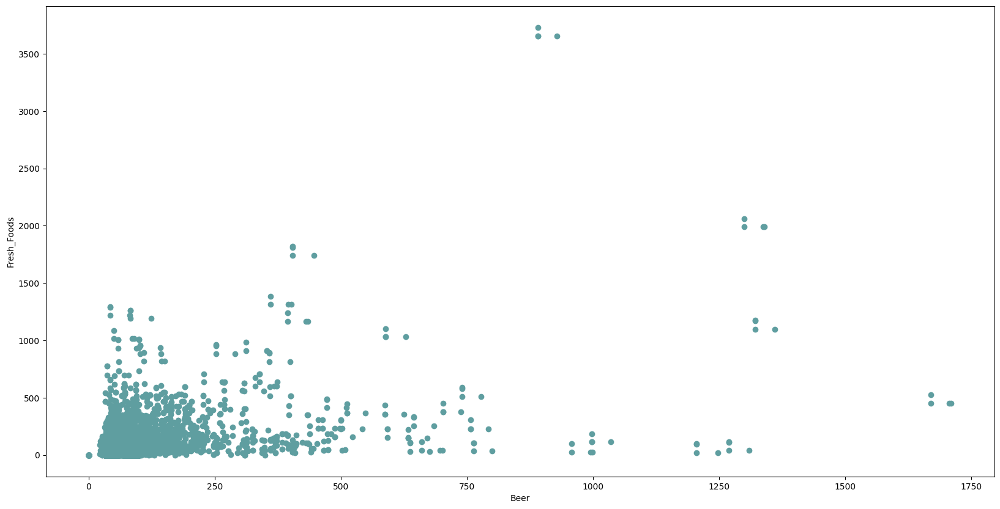

In [ ]:
plot_scatter(plt.subplots()[1], data.drop(data[data['Beer'] > 5000].index), 'Beer', 'Fresh_Foods')

In [ ]:
pd.set_option('display.max_columns', None)
data[(data['Beer'] > 1500) & (data['Beer'] < 1750)]

,ID_Client,Frequency_items,Potencial_Score,Longevity_months,Credit_factor,Relevance_criteria,Recency_in_weeks,Returns,Flaged,Promotional_percentage,Beer,Bottled_Water,Bread,Meat,Dairy,Fresh_Foods,Frozen_Foods,Fruit_Beverages,Pastry,Sodas,Toiletries,Veggies,Wines
3115,10023562SCO9NKID809,54,78.53,18.0,0.7,1.0,7.0,NaN,0.0,32.0,1670,40,144,57,88,450,44.0,36,110,0,29,30,111
42537,10023562SCO9NKID555,59,78.83,26.0,0.7,1.0,7.0,0.0,0.0,32.0,1710,81,144,57,34,450,119.0,36,30,13,34,26,82
42538,10023562SCO9NKID661,59,80.13,20.0,0.7,1.0,4.0,NaN,0.0,32.0,1706,78,144,57,34,450,125.0,36,30,0,21,22,82
42539,10023562SCO9NKID481,43,79.93,14.0,0.7,1.0,0.0,NaN,0.0,32.0,1670,40,144,57,34,524,44.0,113,30,0,20,22,67


In [ ]:
pd.set_option('display.max_columns', None)
data[(data['Fresh_Foods'] > 3000) & (data['Beer'] < 5000)]

,ID_Client,Frequency_items,Potencial_Score,Longevity_months,Credit_factor,Relevance_criteria,Recency_in_weeks,Returns,Flaged,Promotional_percentage,Beer,Bottled_Water,Bread,Meat,Dairy,Fresh_Foods,Frozen_Foods,Fruit_Beverages,Pastry,Sodas,Toiletries,Veggies,Wines
19124,9563830SCA6NKID585,39,77.5,19.0,0.0,0.0,8.0,0.0,1.0,0.0,891,52,1127,6771,82,3654,6988.0,624,1393,4303,95,674,359
89512,9563830SCA6NKID342,32,78.9,20.0,0.0,0.0,5.0,0.0,1.0,0.0,891,52,1138,6771,28,3731,7069.0,704,1393,4303,85,677,360
89513,9563830SCA6NKID633,32,78.6,13.0,0.0,0.0,NaN,0.0,1.0,0.0,928,90,1138,6771,28,3654,7063.0,624,1393,4281,86,677,374
89514,9563830SCA6NKID805,27,78.7,17.0,0.0,0.0,NaN,0.0,1.0,0.0,891,52,1138,6771,28,3654,6988.0,624,1474,4255,2,676,361


In [ ]:
data['NumID'] = data['ID_Client'].str.extract(r'^(\d+)')
data['SeqID'] = data['ID_Client'].str.replace(r'^\d+|\d+$', '', regex=True)
data['RepID'] = data['ID_Client'].str.extract(r'(\d+)$')

In [ ]:
data['NumID'].value_counts()

NumID
10153360    8
9337686     4
10557943    4
10223386    4
10468039    4
           ..
917998      2
10359812    2
99830       2
9437209     2
9561327     2
Name: count, Length: 31056, dtype: int64

There are groups of 2, 3 and 4 replicas. There is just one case in which, for some reason there are 8 (but it is 2 groups of 4)

### Check if filling missing values with NumID is an option

For Education:

In [ ]:
# Group by NumID and check unique values of Education
educ_check = data.groupby('NumID')['Education'].apply(lambda x: x.dropna().unique())

# Filter groups with more than one unique value
ambiguous_educ = educ_check[educ_check.apply(lambda x: len(x) > 1)]

# Display the ambiguous groups
print("Groups with ambiguous Education values:")
ambiguous_educ

Groups with ambiguous Education values:


NumID
10153360    [1.0, 4.0]
Name: Education, dtype: object

There is just one value in which there is more than one value of education inside a group of datapoints with the same NumID (it is the one that has 8 datapoints). So, it is possible!

For Gender:

In [ ]:
# Group by NumID and check unique values of Gender
gender_check = data.groupby('NumID')['Gender'].apply(lambda x: x.dropna().unique())

# Filter groups with more than one unique value
ambiguous_gender = gender_check[gender_check.apply(lambda x: len(x) > 1)]

# Display the ambiguous groups
print("Groups with ambiguous Gender values:")
ambiguous_gender

Groups with ambiguous Gender values:


NumID
100036      [1.0, 0.0]
100093      [1.0, 0.0]
10011423    [0.0, 1.0]
10011756    [0.0, 1.0]
10012552    [0.0, 1.0]
               ...    
9974040     [0.0, 1.0]
99772       [1.0, 0.0]
998622      [1.0, 0.0]
998865      [1.0, 0.0]
999721      [0.0, 1.0]
Name: Gender, Length: 4744, dtype: object

There are many values with ambiguity. We can not derive anything for certain based on NumID.